# **00_Setup**

In [ ]:
#import Gdrive library
from google.colab import drive
#mounting Gdrive
mount_point = '/content/gdrive'
drive.mount(mount_point)

In [ ]:
#Installers
!pip install osmnx 
!pip install networkx
!pip install momepy
!pip install mapclassify 
!pip install fiona
!pip install matplotlib==3.1.3
!pip uninstall shapely
!pip install shapely

In [ ]:
#Import Libraries
import momepy
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox
#ox.config(use_cache=True, log_console=True)
import numpy as np
import pandas as pd
%matplotlib inline
import fiona
import shapely
from collections import Counter

Set Root Drive location

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
#set root drive location to save all geojsons
root = ''

# **01_CITY GRAPH**

### *OSM Network Data*

In [ ]:
#geocodable placename with administrative boundary
vienna = 'Vienna, 1010, Austria'

**Get network frame from OSM because vienna's open gov length data is inaccurate**

In [ ]:
vGx=ox.graph_from_place(vienna, network_type='all')

In [ ]:
nodes_ox, edges_ox = ox.graph_to_gdfs(vGx)

In [ ]:
#copy nodes and edges to avoid running previous cell over again
nodes_ox2=nodes_ox.copy()
edges_ox2=edges_ox.copy()

In [ ]:
# # #uncomment and run this to restart edges
# nodes_ox=nodes_ox2
# edges_ox=edges_ox2

In [ ]:
print(nodes_ox.shape)
nodes_ox.head(3)

(112034, 6)


,y,x,highway,street_count,ref,geometry
osmid,,,,,,
199732,48.208662,16.360136,traffic_signals,4,NaN,POINT (16.36014 48.20866)
199735,48.206836,16.355856,traffic_signals,4,NaN,POINT (16.35586 48.20684)
199736,48.207697,16.355375,NaN,3,NaN,POINT (16.35537 48.20770)


In [ ]:
print(edges_ox.shape)
edges_ox.head(3)

(301066, 17)


osmid  oneway lanes              name    highway  \
u      v          key                                                        
199732 2447309494 0    29065909    True     3  Universitätsring  secondary   
       4683383695 0    11000070   False   NaN               NaN   cycleway   
       318697385  0    25535788   False     3      Rathausplatz   tertiary   

                      maxspeed  length  \
u      v          key                    
199732 2447309494 0         50  11.008   
       4683383695 0        NaN  14.358   
       318697385  0         50  20.372   

                                                                geometry  \
u      v          key                                                      
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)   
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...   
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...   

                      tunnel access  ref bridge width service junction  \
u      v          key                                                    
199732 2447309494 0      NaN    NaN  NaN    NaN   NaN     NaN      NaN   
       4683383695 0      NaN    NaN  NaN    NaN   NaN     NaN      NaN   
       318697385  0      NaN    NaN  NaN    NaN   NaN     NaN      NaN   

                      est_width area  
u      v          key                 
199732 2447309494 0         NaN  NaN  
       4683383695 0         NaN  NaN  
       318697385  0         NaN  NaN

In [ ]:
vstreets_ox=edges_ox.loc[:, 'osmid':'geometry']
edges_ox.head(3)

osmid  oneway lanes              name    highway  \
u      v          key                                                        
199732 2447309494 0    29065909    True     3  Universitätsring  secondary   
       4683383695 0    11000070   False   NaN               NaN   cycleway   
       318697385  0    25535788   False     3      Rathausplatz   tertiary   

                      maxspeed  length  \
u      v          key                    
199732 2447309494 0         50  11.008   
       4683383695 0        NaN  14.358   
       318697385  0         50  20.372   

                                                                geometry  \
u      v          key                                                      
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)   
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...   
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...   

                      tunnel access  ref bridge width service junction  \
u      v          key                                                    
199732 2447309494 0      NaN    NaN  NaN    NaN   NaN     NaN      NaN   
       4683383695 0      NaN    NaN  NaN    NaN   NaN     NaN      NaN   
       318697385  0      NaN    NaN  NaN    NaN   NaN     NaN      NaN   

                      est_width area  
u      v          key                 
199732 2447309494 0         NaN  NaN  
       4683383695 0         NaN  NaN  
       318697385  0         NaN  NaN

# **02_PUBLIC IMAGE & COMFORT**

## LOAD FILES

In [ ]:
trees_url='https://data.wien.gv.at/daten/geo?service=WFS&request=GetFeature&version=1.1.0&typeName=ogdwien:BAUMKATOGD&srsName=EPSG:4326&outputFormat=json'
public_toilets_url='https://data.wien.gv.at/daten/geo?service=WFS&request=GetFeature&version=1.1.0&typeName=ogdwien:WCANLAGE2OGD&srsName=EPSG:4326&outputFormat=json'
drinking_fountains_url = 'https://data.wien.gv.at/daten/geo?service=WFS&request=GetFeature&version=1.1.0&typeName=ogdwien:TRINKBRUNNENOGD&srsName=EPSG:4326&outputFormat=json'

In [ ]:
#trees & greeneries
trees = gpd.read_file(trees_url, delimeter=';')
#public comfort
public_toilets = gpd.read_file(public_toilets_url, delimeter=';')
drinking_fountains = gpd.read_file(drinking_fountains_url, delimeter=';')

## TREES

In [ ]:
print(trees.shape)
trees.info()

(213042, 19)
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 213042 entries, 0 to 213041
Data columns (total 19 columns):
 #   Column                 Non-Null Count   Dtype   
---  ------                 --------------   -----   
 0   id                     213042 non-null  object  
 1   OBJECTID               213042 non-null  int64   
 2   BAUM_ID                213042 non-null  int64   
 3   DATENFUEHRUNG          213042 non-null  object  
 4   BEZIRK                 212486 non-null  float64 
 5   OBJEKT_STRASSE         213042 non-null  object  
 6   GEBIETSGRUPPE          213042 non-null  object  
 7   GATTUNG_ART            213042 non-null  object  
 8   PFLANZJAHR             213042 non-null  int64   
 9   PFLANZJAHR_TXT         213042 non-null  object  
 10  STAMMUMFANG            213042 non-null  int64   
 11  STAMMUMFANG_TXT        213042 non-null  object  
 12  BAUMHOEHE              213042 non-null  int64   
 13  BAUMHOEHE_TXT          213042 non-null  object  
 14 

In [ ]:
# Add x and y location and check trees
trees['x']=trees.geometry.x
trees['y']=trees.geometry.y
print(trees.shape)
trees.head(2)

(213042, 21)


,id,OBJECTID,BAUM_ID,DATENFUEHRUNG,BEZIRK,OBJEKT_STRASSE,GEBIETSGRUPPE,GATTUNG_ART,PFLANZJAHR,PFLANZJAHR_TXT,...,STAMMUMFANG_TXT,BAUMHOEHE,BAUMHOEHE_TXT,KRONENDURCHMESSER,KRONENDURCHMESSER_TXT,BAUMNUMMER,SE_ANNO_CAD_DATA,geometry,x,y
0,BAUMKATOGD.471033674,471033674,247132,magistrat,12.0,"12., Marillenalm, MA42",MA 42 - Parkanlage,Acer pseudoplatanus (Bergahorn),0,nicht definiert,...,292 cm,3,11-15 m,2,4-6 m,93,None,POINT (16.31771 48.17871),16.317713,48.178708
1,BAUMKATOGD.471033675,471033675,247133,magistrat,12.0,"12., Marillenalm, MA42",MA 42 - Parkanlage,Acer platanoides (Spitzahorn),0,nicht definiert,...,127 cm,3,11-15 m,2,4-6 m,94,None,POINT (16.31770 48.17873),16.317703,48.178730


### Generate Tree Index

In [ ]:
#use spatial index to count trees
t_counts_ox=vstreets_ox.geometry.sindex.nearest(trees.geometry, max_distance=0.5)
print(t_counts_ox)
print(t_counts_ox.shape)

[[     0      0      1 ... 213040 213041 213041]
 [ 77202  77198  77202 ...   6916  49261   9864]]
(2, 311663)


In [ ]:
#use counter to get bunch numbers together to get trees on edges
tree_counts_ox= Counter(t_counts_ox[-1])
edge_no_of_trees_ox = [tree_counts_ox[i] for i in range(vstreets_ox.shape[0])]
print(edge_no_of_trees_ox)

[0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 3, 8, 0, 0, 0, 0, 14, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 7, 30, 0, 10, 0, 33, 11, 6, 34, 25, 27, 17, 0, 0, 20, 0, 0, 39, 15, 24, 0, 37, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 11, 0, 0, 0, 0, 0, 0, 0, 45, 0, 1, 0, 18, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 6, 12, 16, 0, 18, 4, 0, 0, 0, 0, 23, 0, 7, 2, 0, 1, 1, 7, 3, 10, 1, 0, 4, 0, 5, 0, 1, 0, 2, 3, 3, 1, 22, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 19, 3, 0, 0, 12, 1, 0, 18, 0, 0, 1, 3, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 0, 4, 2, 6, 0, 8, 4, 4, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 3, 1, 22, 0, 0, 0, 0, 5, 0, 0, 0, 0, 1, 0, 23, 0, 10, 0, 0, 0, 4, 3, 8, 0, 3, 3, 6, 7, 0, 0, 0, 4, 0, 0, 0, 4, 3, 4, 1, 13, 0, 0, 2, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 9, 14, 0, 1, 0, 17, 1, 10,

In [ ]:
#add column to main v_streets dataframe
vstreets_ox['tree_counts']=edge_no_of_trees_ox

In [ ]:
tree_index_ox=round(vstreets_ox['tree_counts']/vstreets_ox['length'], 3)

In [ ]:
n=tree_index_ox.max()
print(n)
vstreets_ox['tree_index']=tree_index_ox
vstreets_ox['tree_index_rev']= [n-i for i in vstreets_ox['tree_index'].to_list()]

19.716


In [ ]:
vstreets_ox.head(2)

osmid  oneway lanes              name    highway  \
u      v          key                                                        
199732 2447309494 0    29065909    True     3  Universitätsring  secondary   
       4683383695 0    11000070   False   NaN               NaN   cycleway   

                      maxspeed  length  \
u      v          key                    
199732 2447309494 0         50  11.008   
       4683383695 0        NaN  14.358   

                                                                geometry  \
u      v          key                                                      
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)   
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...   

                       tree_counts  tree_index  tree_index_rev  
u      v          key                                           
199732 2447309494 0              0       0.000          19.716  
       4683383695 0              2       0.139          19.577

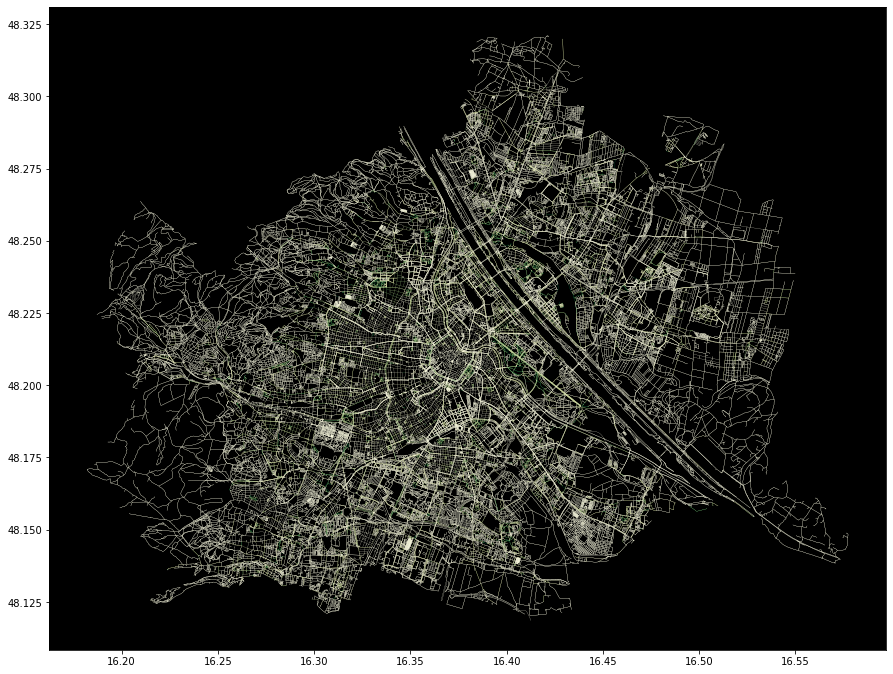

In [ ]:
# #Plot tree data
# fig, ax = plt.subplots(figsize=(15,15))
# ax.set_facecolor('black')
# vstreets_ox.plot('tree_index', cmap='YlGn', ax=ax, vmax=0.5, edgecolor='blue', linewidth=0.2)
# plt.show()

### Save Tree information for static layers

In [ ]:
#save geojson 
df_tree = vstreets_ox.loc[:, ['name', 'tree_index', 'tree_counts','geometry']]

In [ ]:
tree_names = df_tree.name.values

In [ ]:
for j, i in enumerate(tree_names):
  if type(i) == list:
   tree_names[j] = tree_names[j][0]

In [ ]:
df_tree.head()

name  tree_index  tree_counts  \
u      v          key                                              
199732 2447309494 0    Universitätsring       0.000            0   
       4683383695 0                 NaN       0.139            2   
       318697385  0        Rathausplatz       0.000            0   
199735 8946359241 0     Schmerlingplatz       0.000            0   
       33183691   0     Auerspergstraße       0.000            0   

                                                                geometry  
u      v          key                                                     
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)  
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...  
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...  
199735 8946359241 0    LINESTRING (16.35586 48.20684, 16.35590 48.20685)  
       33183691   0    LINESTRING (16.35586 48.20684, 16.35582 48.206...

In [ ]:
df_tree.shape

(301066, 4)

In [ ]:
tr=df_tree.iloc[411, :]
tr.head()

name                                           Prater Hochstraße
tree_index                                                   0.0
tree_counts                                                    0
geometry       LINESTRING (16.4302663 48.202609, 16.4284578 4...
Name: (378985, 66893213, 0), dtype: object

In [ ]:
df_tree.to_file(root+'/trees2', driver = 'GeoJSON')

In [ ]:
plt.savefig(fname='green', format='png', dpi=300)

<Figure size 432x288 with 0 Axes>

## PUBLIC RESTROOMS

Generate Public Restroom Index

In [ ]:
public_toilets.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 274 entries, 0 to 273
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   id                 274 non-null    object  
 1   OBJECTID           274 non-null    int64   
 2   WC_ID              273 non-null    object  
 3   BEZIRK             274 non-null    int64   
 4   STRASSE            274 non-null    object  
 5   ORTSANGABE         190 non-null    object  
 6   AKTIV              274 non-null    int64   
 7   AKTIV_TXT          274 non-null    object  
 8   OEFFNUNGSZEIT      274 non-null    object  
 9   EINSCHRAENKUNGEN   274 non-null    object  
 10  PERSONALBETREUUNG  274 non-null    object  
 11  KATEGORIE          269 non-null    object  
 12  AUSSTATTUNG        169 non-null    object  
 13  ICON               274 non-null    object  
 14  ICON_TXT           274 non-null    object  
 15  KONTAKT            274 non-null    object  
 16  

In [ ]:
# Add x and y location and check data
public_toilets['x']=public_toilets.geometry.x
public_toilets['y']=public_toilets.geometry.y
print(public_toilets.shape)
public_toilets.head(2)

(274, 22)


,id,OBJECTID,WC_ID,BEZIRK,STRASSE,ORTSANGABE,AKTIV,AKTIV_TXT,OEFFNUNGSZEIT,EINSCHRAENKUNGEN,...,AUSSTATTUNG,ICON,ICON_TXT,KONTAKT,ABTEILUNG,INFORMATION,SE_ANNO_CAD_DATA,geometry,x,y
0,WCANLAGE2OGD.fid-3c2bbd1e_18185a9ac90_-4f29,149647,M48_0094,16,Gallitzinstraße / Funkengerngasse,None,-1,JA,00:00-24:00 Uhr,ganzjährig ohne Einschränkungen,...,keine,M,Herren,+43 (1) 546 48,MA 48,https://www.wien.gv.at/umwelt/ma48/sauberestad...,None,POINT (16.29476 48.21521),16.294758,48.215205
1,WCANLAGE2OGD.fid-3c2bbd1e_18185a9ac90_-4f28,149648,M48_0368,12,Wilhelmsdorfer Park,None,-1,JA,00:00-24:00 Uhr,ganzjährig ohne Einschränkungen,...,keine,U,Damen und Herren,+43 (1) 546 48,MA 48,https://www.wien.gv.at/umwelt/ma48/sauberestad...,None,POINT (16.33824 48.17830),16.338245,48.178295


In [ ]:
#use spatial index to count trees
pt_counts_ox=vstreets_ox.geometry.sindex.nearest(public_toilets.geometry, max_distance=0.5)
print(pt_counts_ox)
print(pt_counts_ox.shape)

In [ ]:
#use counter to get bunch numbers together to get traffic_lights on edges
pub_rest_counts_ox= Counter(pt_counts_ox[-1])
edge_no_of_pt_ox = [pub_rest_counts_ox[i] for i in range(vstreets_ox.shape[0])]
print(edge_no_of_pt_ox)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
#add column to main v_streets dataframe
pt=max(edge_no_of_pt_ox)
print(pt)
vstreets_ox['public_toilets']=edge_no_of_pt_ox
vstreets_ox['public_toilets_rev'] = [pt-i for i in vstreets_ox['public_toilets'].to_list()]


6


In [ ]:
vstreets_ox.head()

osmid  oneway lanes              name    highway  \
u      v          key                                                        
199732 2447309494 0    29065909    True     3  Universitätsring  secondary   
       4683383695 0    11000070   False   NaN               NaN   cycleway   
       318697385  0    25535788   False     3      Rathausplatz   tertiary   
199735 8946359241 0     4997667    True   NaN   Schmerlingplatz   tertiary   
       33183691   0    25498425    True     2   Auerspergstraße  secondary   

                      maxspeed  length  \
u      v          key                    
199732 2447309494 0         50  11.008   
       4683383695 0        NaN  14.358   
       318697385  0         50  20.372   
199735 8946359241 0         30   3.473   
       33183691   0         50  16.389   

                                                                geometry  \
u      v          key                                                      
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)   
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...   
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...   
199735 8946359241 0    LINESTRING (16.35586 48.20684, 16.35590 48.20685)   
       33183691   0    LINESTRING (16.35586 48.20684, 16.35582 48.206...   

                       tree_counts  tree_index  tree_index_rev  \
u      v          key                                            
199732 2447309494 0              0       0.000          19.716   
       4683383695 0              2       0.139          19.577   
       318697385  0              0       0.000          19.716   
199735 8946359241 0              0       0.000          19.716   
       33183691   0              0       0.000          19.716   

                       public_toilets  public_toilets_rev  
u      v          key                                      
199732 2447309494 0                 0                   6  
       4683383695 0                 0                   6  
       318697385  0                 0                   6  
199735 8946359241 0                 0                   6  
       33183691   0                 0                   6

### Save Public Restroom information for static layers

In [ ]:
#save geojson 
df_restrooms = vstreets_ox.loc[:, ['name', 'public_toilets', 'geometry']]

In [ ]:
df_restrooms.head()

name  public_toilets  \
u      v          key                                     
199732 2447309494 0    Universitätsring               0   
       4683383695 0                 NaN               0   
       318697385  0        Rathausplatz               0   
199735 8946359241 0     Schmerlingplatz               0   
       33183691   0     Auerspergstraße               0   

                                                                geometry  
u      v          key                                                     
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)  
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...  
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...  
199735 8946359241 0    LINESTRING (16.35586 48.20684, 16.35590 48.20685)  
       33183691   0    LINESTRING (16.35586 48.20684, 16.35582 48.206...

In [ ]:
# df_restrooms = df_restrooms.reset_index()
# df_restrooms = df_restrooms.drop(columns = ['u', 'v', 'key'])
names = df_restrooms.name.values
for j, i in enumerate(names):
  if type(i) == list:
   names[j] = names[j][0]

In [ ]:
df_restrooms.iloc[411,:]

name                                              Prater Hochstraße
public_toilets                                                    0
geometry          LINESTRING (16.4302663 48.202609, 16.4284578 4...
Name: (378985, 66893213, 0), dtype: object

In [ ]:
df_restrooms.to_file(root+'/public_restrooms2', driver = 'GeoJSON')

## DRINKING FOUNTAINS

In [ ]:
drinking_fountains.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1867 entries, 0 to 1866
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   id                1867 non-null   object  
 1   OBJECTID          1867 non-null   int64   
 2   BASIS_TYP_TXT     1867 non-null   object  
 3   BASIS_TYP         1867 non-null   int64   
 4   SE_ANNO_CAD_DATA  0 non-null      object  
 5   geometry          1867 non-null   geometry
dtypes: geometry(1), int64(2), object(3)
memory usage: 87.6+ KB


In [ ]:
# Add x and y location and check data
drinking_fountains['x']=drinking_fountains.geometry.x
drinking_fountains['y']=drinking_fountains.geometry.y
print(drinking_fountains.shape)
drinking_fountains.head(2)

(1867, 8)


,id,OBJECTID,BASIS_TYP_TXT,BASIS_TYP,SE_ANNO_CAD_DATA,geometry,x,y
0,TRINKBRUNNENOGD.fid-6e2b8d9c_1818594224d_1087,3217618,Trinkbrunnen mit Tränke,5,None,POINT (16.40688 48.14558),16.406879,48.145584
1,TRINKBRUNNENOGD.fid-6e2b8d9c_1818594224d_1088,3217619,Spielbrunnen,3,None,POINT (16.40563 48.14839),16.405633,48.148389


In [ ]:
#use spatial index to count data
drf_counts_ox=vstreets_ox.geometry.sindex.nearest(drinking_fountains.geometry, max_distance=0.1)
print(drf_counts_ox)
print(drf_counts_ox.shape)

[[     0      1      1 ...   1865   1865   1866]
 [242831  61632  53819 ... 267241 249700  11450]]
(2, 2856)


In [ ]:
#use counter to get bunch numbers together to get traffic_lights on edges
dr_fount_counts_ox= Counter(drf_counts_ox[-1])
edge_no_of_drf_ox = [dr_fount_counts_ox[i] for i in range(vstreets_ox.shape[0])]
print(edge_no_of_drf_ox)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
#add column to main v_streets dataframe
dff=max(edge_no_of_drf_ox)
print(dff)
vstreets_ox['drinking_fountain']=edge_no_of_drf_ox
vstreets_ox['drinking_fountain_rev'] = [dff-i for i in vstreets_ox['drinking_fountain'].to_list()]

5


In [ ]:
vstreets_ox.head(3)

osmid  oneway lanes              name    highway  \
u      v          key                                                        
199732 2447309494 0    29065909    True     3  Universitätsring  secondary   
       4683383695 0    11000070   False   NaN               NaN   cycleway   
       318697385  0    25535788   False     3      Rathausplatz   tertiary   

                      maxspeed  length  \
u      v          key                    
199732 2447309494 0         50  11.008   
       4683383695 0        NaN  14.358   
       318697385  0         50  20.372   

                                                                geometry  \
u      v          key                                                      
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)   
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...   
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...   

                       tree_counts  tree_index  tree_index_rev  \
u      v          key                                            
199732 2447309494 0              0       0.000          19.716   
       4683383695 0              2       0.139          19.577   
       318697385  0              0       0.000          19.716   

                       public_toilets  public_toilets_rev  drinking_fountain  \
u      v          key                                                          
199732 2447309494 0                 0                   6                  0   
       4683383695 0                 0                   6                  0   
       318697385  0                 0                   6                  0   

                       drinking_fountain_rev  
u      v          key                         
199732 2447309494 0                        5  
       4683383695 0                        5  
       318697385  0                        5

In [ ]:
#save geojson 
df_fountain = vstreets_ox.loc[:, ['name', 'drinking_fountain', 'geometry']]

In [ ]:
# df_fountain = df_fountain.reset_index()
# df_fountain= df_fountain.drop(columns = ['u', 'v', 'key'])
names = df_fountain.name.values
for j, i in enumerate(names):
  if type(i) == list:
   names[j] = names[j][0]

In [ ]:
df_fountain.iloc[411,:]

name                                                 Prater Hochstraße
drinking_fountain                                                    0
geometry             LINESTRING (16.4302663 48.202609, 16.4284578 4...
Name: (378985, 66893213, 0), dtype: object

In [ ]:
df_fountain.to_file(root+'/drinking_fountains2', driver = 'GeoJSON')

## **WEIGHTED PUBLIC IMAGE SCORE**

In [ ]:
df_public_ave = vstreets_ox.loc[:, ['name', 'tree_index', 'public_toilets', 'drinking_fountain','NODE_FROM', 'NODE_TO' 'geometry']]

In [ ]:
toilets = df_public_ave.loc[:, 'public_toilets'].to_list()
print(toilets)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
k=max(toilets)
l = [i/k for i in toilets]

In [ ]:
founts = df_public_ave.loc[:, 'drinking_fountain'].to_list()

In [ ]:
k2 = max(founts)
l2 = [i/2 for i in toilets]

In [ ]:
df_public_ave['public_toilets'] = l
df_public_ave['drinking_fountain'] = l2

In [ ]:
df_public_ave = df_public_ave .reset_index()
# df_public_ave = df_public_ave .drop(columns = ['u', 'v', 'key'])
names = df_public_ave.name.values
for j, i in enumerate(names):
  if type(i) == list:
   names[j] = names[j][0]

In [ ]:
def weighted_sum(row):
  return (0.5*row.tree_index) + (0.25 * row.public_toilets) + (0.25*row.drinking_fountain)

In [ ]:
df_public_ave['weighted_sum'] = df_public_ave.apply(weighted_sum, axis=1)

In [ ]:
df_public_ave.head()

,u,v,key,name,tree_index,public_toilets,drinking_fountain,geometry,weighted_sum
0,199732,2447309494,0,Universitätsring,0.000,0.0,0.0,"LINESTRING (16.36014 48.20866, 16.36016 48.20876)",0.0000
1,199732,4683383695,0,NaN,0.139,0.0,0.0,"LINESTRING (16.36014 48.20866, 16.36019 48.208...",0.0695
2,199732,318697385,0,Rathausplatz,0.000,0.0,0.0,"LINESTRING (16.36014 48.20866, 16.36005 48.208...",0.0000
3,199735,8946359241,0,Schmerlingplatz,0.000,0.0,0.0,"LINESTRING (16.35586 48.20684, 16.35590 48.20685)",0.0000
4,199735,33183691,0,Auerspergstraße,0.000,0.0,0.0,"LINESTRING (16.35586 48.20684, 16.35582 48.206...",0.0000


In [ ]:
df_public_ave.shape

(301066, 9)

In [ ]:
#save public image geojson for use in static layer
df_public_ave.to_file(root+'/city_graph', driver = 'GeoJSON')

In [ ]:
#save city nodes as geojson:
nodes_ox.to_file(root+'/nodes', driver = 'GeoJSON')

# **03_ACCESSIBILITY**

## LOAD FILES

In [ ]:
traffic_url='https://data.wien.gv.at/daten/geo?service=WFS&request=GetFeature&version=1.1.0&typeName=ogdwien:AKUSTISCHEAMPELOGD&srsName=EPSG:4326&outputFormat=json'
low_sidewalk_url='https://data.wien.gv.at/daten/geo?service=WFS&request=GetFeature&version=1.1.0&typeName=ogdwien:SISGEHSTEIGABSOGD&srsName=EPSG:4326&outputFormat=json'
sidewalk_width_url='https://data.wien.gv.at/daten/geo?service=WFS&request=GetFeature&version=1.1.0&typeName=ogdwien:GSTGBREITEOGD&srsName=EPSG:4326&outputFormat=json'
tactile_sidewalk_url='https://data.wien.gv.at/daten/geo?service=WFS&request=GetFeature&version=1.1.0&typeName=ogdwien:BLINDENLEITSYSOGD&srsName=EPSG:4326&outputFormat=json'
elevator_url= 'https://data.wien.gv.at/daten/geo?service=WFS&request=GetFeature&version=1.1.0&typeName=ogdwien:AUFZUGOGD&srsName=EPSG:4326&outputFormat=json'
disabled_parking_url = 'https://data.wien.gv.at/daten/geo?service=WFS&request=GetFeature&version=1.1.0&typeName=ogdwien:BEHINDERTENPARKPLATZOGD&srsName=EPSG:4326&outputFormat=json'

In [ ]:
#accessibility url
traffic_lights = gpd.read_file(traffic_url, delimeter=';')
elevators = gpd.read_file(elevator_url, delimeter=';')
tactile_sidewalk = gpd.read_file(tactile_sidewalk_url, delimeter=';')
low_sidewalk = gpd.read_file(low_sidewalk_url, delimeter=';') #takes some time to load
sidewalk_width= gpd.read_file(sidewalk_width_url, delimeter=';') #takes too long to load
disabled_parking=gpd.read_file(disabled_parking_url, delimeter=';')

## ACOUSTIC TRAFFIC LIGHTS

In [ ]:
print(traffic_lights.shape)
traffic_lights.head(2)

(1014, 8)


,id,BEZIRK,KREUZUNG,ANL_TYPE,ANL_NR,SE_SDO_ROWID,SE_ANNO_CAD_DATA,geometry
0,AKUSTISCHEAMPELOGD.303374,21.0,Donaufelder Str.-Schloßhofer Str._Hoßpl.,Verkehrslichtsignalanlage,V21024-01,303374,None,POINT (16.40838 48.25497)
1,AKUSTISCHEAMPELOGD.303375,13.0,Rosenhügelstr.-ON 192,geregelter Fußgängerübergang,V13037-01,303375,None,POINT (16.28595 48.15943)


In [ ]:
# Add x and y location and check data
traffic_lights['x'] = traffic_lights.geometry.x
traffic_lights['y'] = traffic_lights.geometry.y
traffic_lights.head()

,id,BEZIRK,KREUZUNG,ANL_TYPE,ANL_NR,SE_SDO_ROWID,SE_ANNO_CAD_DATA,geometry,x,y
0,AKUSTISCHEAMPELOGD.303374,21.0,Donaufelder Str.-Schloßhofer Str._Hoßpl.,Verkehrslichtsignalanlage,V21024-01,303374,None,POINT (16.40838 48.25497),16.408379,48.254972
1,AKUSTISCHEAMPELOGD.303375,13.0,Rosenhügelstr.-ON 192,geregelter Fußgängerübergang,V13037-01,303375,None,POINT (16.28595 48.15943),16.285954,48.159432
2,AKUSTISCHEAMPELOGD.303376,4.0,Favoritenstr.-Taubstummeng.,geregelter Fußgängerübergang,V04039-01,303376,None,POINT (16.36987 48.19472),16.369867,48.194720
3,AKUSTISCHEAMPELOGD.303378,23.0,Draschestr.-Pfarrg.,Verkehrslichtsignalanlage,V23015-01,303378,None,POINT (16.34715 48.14971),16.347145,48.149706
4,AKUSTISCHEAMPELOGD.303383,22.0,Eßlinger Hauptstr.-Telephonweg_Kirschenal,Verkehrslichtsignalanlage,V22029-01,303383,None,POINT (16.51957 48.21451),16.519572,48.214509


In [ ]:
#use spatial index to count data
tl_counts_ox=vstreets_ox.geometry.sindex.nearest(traffic_lights.geometry, max_distance=0.2)
print(tl_counts_ox)
print(tl_counts_ox.shape)

[[     0      1      2 ...   1011   1012   1013]
 [ 88680 272431   4895 ... 201964 231106  13399]]
(2, 1228)


In [ ]:
#use counter to get bunch numbers together to get traffic_lights on edges
traffic_lights_counts_ox= Counter(tl_counts_ox[-1])
edge_no_of_tl_ox = [traffic_lights_counts_ox[i] for i in range(vstreets_ox.shape[0])]
print(edge_no_of_tl_ox)

[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 

In [ ]:
#add data to dataframe
l=max(edge_no_of_tl_ox)
print(l)
vstreets_ox['acoustic_lights'] = edge_no_of_tl_ox
vstreets_ox['acoustic-lights_rev'] = [l-i for i in vstreets_ox['acoustic_lights'].to_list()]

2


In [ ]:
vstreets_ox.head(3)

osmid  oneway lanes              name    highway  \
u      v          key                                                        
199732 2447309494 0    29065909    True     3  Universitätsring  secondary   
       4683383695 0    11000070   False   NaN               NaN   cycleway   
       318697385  0    25535788   False     3      Rathausplatz   tertiary   

                      maxspeed  length  \
u      v          key                    
199732 2447309494 0         50  11.008   
       4683383695 0        NaN  14.358   
       318697385  0         50  20.372   

                                                                geometry  \
u      v          key                                                      
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)   
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...   
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...   

                       tree_counts  tree_index  tree_index_rev  \
u      v          key                                            
199732 2447309494 0              0       0.000          19.716   
       4683383695 0              2       0.139          19.577   
       318697385  0              0       0.000          19.716   

                       public_toilets  public_toilets_rev  drinking_fountain  \
u      v          key                                                          
199732 2447309494 0                 0                   6                  0   
       4683383695 0                 0                   6                  0   
       318697385  0                 0                   6                  0   

                       drinking_fountain_rev  acoustic_lights  \
u      v          key                                           
199732 2447309494 0                        5                1   
       4683383695 0                        5                0   
       318697385  0                        5                0   

                       acoustic-lights_rev  
u      v          key                       
199732 2447309494 0                      1  
       4683383695 0                      2  
       318697385  0                      2

In [ ]:
#save geojson 
df_acoustics = vstreets_ox.loc[:, ['name', 'acoustic_lights', 'geometry']]

In [ ]:
# df_acoustics = df_acoustics.reset_index()
# df_acoustics= df_acoustics.drop(columns = ['u', 'v', 'key'])
names = df_acoustics.name.values
for j, i in enumerate(names):
  if type(i) == list:
   names[j] = names[j][0]

## ELEVATORS

In [ ]:
print(elevators.shape)
elevators.head(2)

(305, 10)


,id,OBJECTID,STATION,LINIE,BEMERKUNG,ANLAGEN_ID,GRUPPEN_ID,BETREIBER,SE_ANNO_CAD_DATA,geometry
0,AUFZUGOGD.1856,1856,HARDEGGASSE,U2,Aufzug fährt vom Aufnahmgebäude Ausgang Hardeg...,AR A02,None,Wiener Linien,None,POINT (16.45775 48.22091)
1,AUFZUGOGD.1857,1857,DONAUMARINA,U2,Aufzug fährt vom stadteinwärtigen Aufnahmegebä...,DM A02,None,Wiener Linien,None,POINT (16.43092 48.20622)


In [ ]:
# Add x and y location and check data
elevators['x'] = elevators.geometry.x
elevators['y'] = elevators.geometry.y
elevators.head(2)

,id,OBJECTID,STATION,LINIE,BEMERKUNG,ANLAGEN_ID,GRUPPEN_ID,BETREIBER,SE_ANNO_CAD_DATA,geometry,x,y
0,AUFZUGOGD.1856,1856,HARDEGGASSE,U2,Aufzug fährt vom Aufnahmgebäude Ausgang Hardeg...,AR A02,None,Wiener Linien,None,POINT (16.45775 48.22091),16.457745,48.220912
1,AUFZUGOGD.1857,1857,DONAUMARINA,U2,Aufzug fährt vom stadteinwärtigen Aufnahmegebä...,DM A02,None,Wiener Linien,None,POINT (16.43092 48.20622),16.430917,48.206224


In [ ]:
#use spatial index to count data
el_counts_ox=vstreets_ox.geometry.sindex.nearest(elevators.geometry, max_distance=0.2)
print(el_counts_ox)
print(el_counts_ox.shape)

In [ ]:
#use counter to get bunch numbers together to get traffic_lights on edges
elevator_counts_ox= Counter(el_counts_ox[-1])
edge_no_of_el_ox = [elevator_counts_ox[i] for i in range(vstreets_ox.shape[0])]
print(edge_no_of_el_ox)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
#Add data to dataframe
l=max(edge_no_of_el_ox)
print(l)
vstreets_ox['elevators'] = edge_no_of_tl_ox
vstreets_ox['elevators_rev'] = [l-i for i in vstreets_ox['elevators'].to_list()]

4


In [ ]:
vstreets_ox.head(3)

osmid  oneway lanes              name    highway  \
u      v          key                                                        
199732 2447309494 0    29065909    True     3  Universitätsring  secondary   
       4683383695 0    11000070   False   NaN               NaN   cycleway   
       318697385  0    25535788   False     3      Rathausplatz   tertiary   

                      maxspeed  length  \
u      v          key                    
199732 2447309494 0         50  11.008   
       4683383695 0        NaN  14.358   
       318697385  0         50  20.372   

                                                                geometry  \
u      v          key                                                      
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)   
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...   
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...   

                       tree_counts  tree_index  tree_index_rev  \
u      v          key                                            
199732 2447309494 0              0       0.000          19.716   
       4683383695 0              2       0.139          19.577   
       318697385  0              0       0.000          19.716   

                       public_toilets  public_toilets_rev  drinking_fountain  \
u      v          key                                                          
199732 2447309494 0                 0                   6                  0   
       4683383695 0                 0                   6                  0   
       318697385  0                 0                   6                  0   

                       drinking_fountain_rev  acoustic_lights  \
u      v          key                                           
199732 2447309494 0                        5                1   
       4683383695 0                        5                0   
       318697385  0                        5                0   

                       acoustic-lights_rev  elevators  elevators_rev  
u      v          key                                                 
199732 2447309494 0                      1          1              3  
       4683383695 0                      2          0              4  
       318697385  0                      2          0              4

## TACTILE SIDEWALK

In [ ]:
print(tactile_sidewalk.shape)
tactile_sidewalk.head(2)

(14476, 6)


,id,OBJECTID,BELAG,WEITERE_INFORMATIONEN,SE_ANNO_CAD_DATA,geometry
0,BLINDENLEITSYSOGD.2000634783,2000634783,Großsteinpfl. mit Fugenverguss,http://www.wien.gv.at/verkehr/strassen/einrich...,None,"POLYGON ((16.38666 48.16777, 16.38647 48.16789..."
1,BLINDENLEITSYSOGD.2000613301,2000613301,Spezial- u. Hartbetonsteine,http://www.wien.gv.at/verkehr/strassen/einrich...,None,"POLYGON ((16.38647 48.16789, 16.38647 48.16789..."


In [ ]:
#use spatial index to count sidewalks. Use query for polygon
tac_sdw_counts_ox=vstreets_ox.geometry.sindex.query_bulk(tactile_sidewalk.geometry.values, predicate = 'intersects') #'intersect', 'within', 'contains', 'overlaps', 'crosses', 'touches']
print(tac_sdw_counts_ox)
print(tac_sdw_counts_ox.shape)

[[     0      0     10 ...  14464  14464  14473]
 [212843  36628 129707 ... 170599  95676   7146]]
(2, 11489)


In [ ]:
#use counter to get bunch numbers together to get tactile_sidewalks on edges. minimise because an edge can only have one occurence of tactile sidewalk
tactile_sidewalks_counts_ox= Counter(tac_sdw_counts_ox[-1])
edge_no_of_ts_ox = [min(1, tactile_sidewalks_counts_ox[i]) for i in range(vstreets_ox.shape[0])]
print(edge_no_of_ts_ox)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
#add data to dataframe
ts=max(edge_no_of_ts_ox)
print(ts)
vstreets_ox['tactile_sidewalks'] = edge_no_of_ts_ox
vstreets_ox['tactile_sidewalks_rev'] = [ts-i for i in vstreets_ox['tactile_sidewalks'].to_list()]

1


In [ ]:
vstreets_ox.head(3)

osmid  oneway lanes              name    highway  \
u      v          key                                                        
199732 2447309494 0    29065909    True     3  Universitätsring  secondary   
       4683383695 0    11000070   False   NaN               NaN   cycleway   
       318697385  0    25535788   False     3      Rathausplatz   tertiary   

                      maxspeed  length  \
u      v          key                    
199732 2447309494 0         50  11.008   
       4683383695 0        NaN  14.358   
       318697385  0         50  20.372   

                                                                geometry  \
u      v          key                                                      
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)   
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...   
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...   

                       tree_counts  tree_index  ...  public_toilets  \
u      v          key                           ...                   
199732 2447309494 0              0       0.000  ...               0   
       4683383695 0              2       0.139  ...               0   
       318697385  0              0       0.000  ...               0   

                       public_toilets_rev  drinking_fountain  \
u      v          key                                          
199732 2447309494 0                     6                  0   
       4683383695 0                     6                  0   
       318697385  0                     6                  0   

                       drinking_fountain_rev  acoustic_lights  \
u      v          key                                           
199732 2447309494 0                        5                1   
       4683383695 0                        5                0   
       318697385  0                        5                0   

                       acoustic-lights_rev  elevators  elevators_rev  \
u      v          key                                                  
199732 2447309494 0                      1          1              3   
       4683383695 0                      2          0              4   
       318697385  0                      2          0              4   

                       tactile_sidewalks  tactile_sidewalks_rev  
u      v          key                                            
199732 2447309494 0                    0                      1  
       4683383695 0                    0                      1  
       318697385  0                    0                      1  

[3 rows x 21 columns]

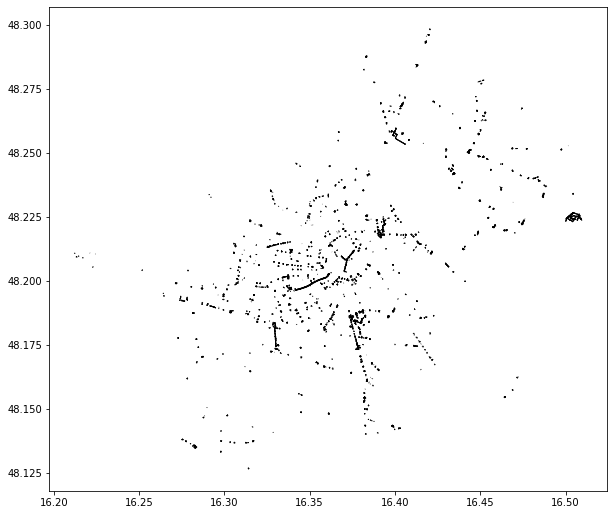

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
tactile_sidewalk.plot(ax=ax, edgecolor='black')
plt.show()

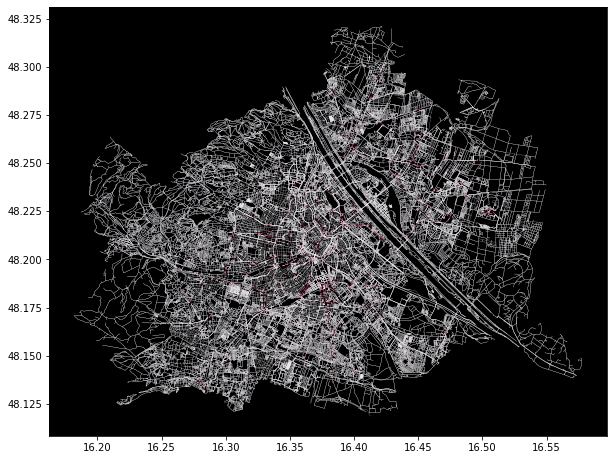

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
ax.axes.set_facecolor('black')
vstreets_ox.plot('tactile_sidewalks', cmap='PuRd', vmax=1, linewidth=0.2, ax=ax, edgecolor='black')
plt.show()

## LOW SIDE WALK

In [ ]:
print(low_sidewalk.shape)
low_sidewalk.info()

(38307, 7)
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 38307 entries, 0 to 38306
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   id                38307 non-null  object  
 1   OBJECTID          38307 non-null  int64   
 2   SIS_ID            38307 non-null  int64   
 3   ABSENKUNG_TXT     38276 non-null  object  
 4   WEBLINK1          38307 non-null  object  
 5   SE_ANNO_CAD_DATA  0 non-null      object  
 6   geometry          38307 non-null  geometry
dtypes: geometry(1), int64(2), object(4)
memory usage: 2.0+ MB


In [ ]:
# Add x and y location and check data
low_sidewalk['x']=low_sidewalk.geometry.x
low_sidewalk['y']=low_sidewalk.geometry.y
print(low_sidewalk.shape)
low_sidewalk.head(2)

(38307, 9)


,id,OBJECTID,SIS_ID,ABSENKUNG_TXT,WEBLINK1,SE_ANNO_CAD_DATA,geometry,x,y
0,SISGEHSTEIGABSOGD.98665278,98665278,1932306,bis 3 cm abgesenkt,http://www.wien.gv.at/verkehr/strassen/einrich...,None,POINT (16.27987 48.18754),16.279874,48.187542
1,SISGEHSTEIGABSOGD.98665279,98665279,1932307,bis 3 cm abgesenkt,http://www.wien.gv.at/verkehr/strassen/einrich...,None,POINT (16.27997 48.18879),16.279968,48.188789


In [ ]:
#use spatial index to count data
ls_counts_ox=vstreets_ox.geometry.sindex.nearest(low_sidewalk.geometry, max_distance=0.2)
print(ls_counts_ox)
print(ls_counts_ox.shape)

[[     0      1      1 ...  38305  38305  38306]
 [105996 223093 223097 ... 211007 211004  57066]]
(2, 49557)


In [ ]:
#use counter to get bunch numbers together to get low sidewalks on edges
low_sidewalk_counts_ox= Counter(ls_counts_ox[-1])
print(low_sidewalk_counts_ox)
edge_no_of_ls_ox = [low_sidewalk_counts_ox[i] for i in range(vstreets_ox.shape[0])]
print(edge_no_of_ls_ox)

Counter({24187: 12, 6275: 11, 13555: 11, 288166: 10, 72227: 9, 73831: 9, 159646: 9, 36076: 8, 21960: 8, 21955: 8, 3051: 8, 12617: 7, 10609: 7, 38547: 7, 17773: 7, 1155: 7, 17781: 7, 72215: 7, 78979: 7, 17272: 7, 17759: 6, 138179: 6, 30397: 6, 30401: 6, 16065: 6, 12623: 6, 17788: 6, 8571: 6, 9953: 6, 49707: 6, 12111: 6, 6919: 6, 83649: 6, 5501: 6, 94103: 6, 263290: 6, 24854: 6, 26231: 6, 131618: 6, 24848: 6, 80189: 6, 3425: 6, 213545: 6, 259956: 6, 26677: 6, 17802: 6, 6972: 6, 26562: 6, 19370: 6, 905: 6, 12262: 6, 8116: 6, 78964: 6, 73828: 6, 67226: 6, 159645: 6, 52357: 5, 4489: 5, 26459: 5, 1177: 5, 10383: 5, 10598: 5, 42211: 5, 2473: 5, 14592: 5, 16185: 5, 85085: 5, 17799: 5, 66512: 5, 13608: 5, 17758: 5, 137294: 5, 40093: 5, 9583: 5, 199304: 5, 12194: 5, 45645: 5, 10435: 5, 119759: 5, 16161: 5, 5367: 5, 4644: 5, 17801: 5, 29399: 5, 26561: 5, 126045: 5, 59750: 5, 10498: 5, 45642: 5, 130423: 5, 152248: 5, 17599: 5, 23940: 5, 181291: 5, 13410: 5, 268244: 5, 95924: 5, 5926: 5, 22282: 5, 

In [ ]:
#add data to dataframe
lsw=max(edge_no_of_ls_ox)
print(lsw)
vstreets_ox['low_sidewalk'] = edge_no_of_ls_ox
vstreets_ox['low_sidewalk_rev'] = [lsw-i for i in vstreets_ox['low_sidewalk'].to_list()]

12


In [ ]:
vstreets_ox.head(3)

osmid  oneway lanes              name    highway  \
u      v          key                                                        
199732 2447309494 0    29065909    True     3  Universitätsring  secondary   
       4683383695 0    11000070   False   NaN               NaN   cycleway   
       318697385  0    25535788   False     3      Rathausplatz   tertiary   

                      maxspeed  length  \
u      v          key                    
199732 2447309494 0         50  11.008   
       4683383695 0        NaN  14.358   
       318697385  0         50  20.372   

                                                                geometry  \
u      v          key                                                      
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)   
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...   
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...   

                       acoustic_lights  acoustic-lights_rev  elevators  \
u      v          key                                                    
199732 2447309494 0                  1                    1          1   
       4683383695 0                  0                    2          0   
       318697385  0                  0                    2          0   

                       elevators_rev  tactile_sidewalks  \
u      v          key                                     
199732 2447309494 0                3                  0   
       4683383695 0                4                  0   
       318697385  0                4                  0   

                       tactile_sidewalks_rev  low_sidewalk  low_sidewalk_rev  
u      v          key                                                         
199732 2447309494 0                        1             0                12  
       4683383695 0                        1             0                12  
       318697385  0                        1             0                12

## SIDEWALK WIDTH

In [ ]:
print(sidewalk_width.shape)
sidewalk_width.head(10)

(167303, 8)


,id,OBJECTID,LINK_ID,NAME1,BR_KLASS,LAENGE,SE_ANNO_CAD_DATA,geometry
0,GSTGBREITEOGD.fid-6e2b8d9c_18185c38fc3_344a,167485,NaN,None,1,4.886405,None,"LINESTRING (16.36702 48.20680, 16.36707 48.20682)"
1,GSTGBREITEOGD.fid-6e2b8d9c_18185c38fc3_344b,167486,NaN,None,1,4.753167,None,"LINESTRING (16.36708 48.20683, 16.36714 48.20685)"
2,GSTGBREITEOGD.fid-6e2b8d9c_18185c38fc3_344c,167487,NaN,None,1,94.679338,None,"LINESTRING (16.35922 48.20758, 16.35919 48.207..."
3,GSTGBREITEOGD.fid-6e2b8d9c_18185c38fc3_344d,167488,NaN,None,1,0.951977,None,"LINESTRING (16.37754 48.20829, 16.37753 48.20828)"
4,GSTGBREITEOGD.fid-6e2b8d9c_18185c38fc3_344e,167489,NaN,None,1,15.749652,None,"LINESTRING (16.35541 48.20842, 16.35562 48.20839)"
5,GSTGBREITEOGD.fid-6e2b8d9c_18185c38fc3_344f,167490,NaN,None,1,0.939079,None,"LINESTRING (16.35575 48.20845, 16.35576 48.20845)"
6,GSTGBREITEOGD.fid-6e2b8d9c_18185c38fc3_3450,167491,NaN,None,1,0.286543,None,"LINESTRING (16.35577 48.20851, 16.35577 48.20851)"
7,GSTGBREITEOGD.fid-6e2b8d9c_18185c38fc3_3451,167492,NaN,None,1,2.021755,None,"LINESTRING (16.35576 48.20853, 16.35574 48.20854)"
8,GSTGBREITEOGD.fid-6e2b8d9c_18185c38fc3_3452,167493,NaN,None,1,9.246294,None,"LINESTRING (16.35564 48.20853, 16.35562 48.208..."
9,GSTGBREITEOGD.fid-6e2b8d9c_18185c38fc3_3453,167494,NaN,None,1,1.606928,None,"LINESTRING (16.35904 48.20869, 16.35904 48.20870)"


In [ ]:
#get midpoint of linestrings
mid_point = sidewalk_width.geometry.interpolate(0.5, normalized = True)
print(mid_point)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'interpolate' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  


0         POINT (16.36705 48.20681)
1         POINT (16.36711 48.20684)
2         POINT (16.35923 48.20801)
3         POINT (16.37753 48.20829)
4         POINT (16.35552 48.20840)
                    ...            
167298    POINT (16.39047 48.21997)
167299    POINT (16.39049 48.21976)
167300    POINT (16.38997 48.21990)
167301    POINT (16.40374 48.21763)
167302    POINT (16.40351 48.21780)
Length: 167303, dtype: geometry


In [ ]:
#use spatial index to count sidewalks. Use query for polygon
sdw_width_counts_ox=vstreets_ox.geometry.sindex.nearest(mid_point, max_distance=0.01) #'intersect', 'within', 'contains', 'overlaps', 'crosses', 'touches']
print(sdw_width_counts_ox)
print(sdw_width_counts_ox.shape)

[[     0      0      1 ... 167300 167301 167302]
 [175320 175318 175320 ... 167931 177221 203171]]
(2, 222487)


In [ ]:
#use counter to get bunch numbers together to get tactile_sidewalks on edges.
#use min to make sure that max value is 1. This is because street widths are measured as 0= <2m: narrow, and 1= >2m:broad)
sidewalk_widths_counts_ox= Counter(tac_sdw_counts_ox[-1])
edge_no_of_sw_ox = [min(1,tactile_sidewalks_counts_ox[i]) for i in range(vstreets_ox.shape[0])]
print(edge_no_of_sw_ox)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
#add data to dataframe
sdw=max(edge_no_of_sw_ox)
print(sdw)
vstreets_ox['sidewalk_width'] = edge_no_of_sw_ox
vstreets_ox['sidewalk_width_rev'] = [sdw-i for i in vstreets_ox['sidewalk_width'].to_list()]

1


In [ ]:
vstreets_ox.head(3)

osmid  oneway lanes              name    highway  \
u      v          key                                                        
199732 2447309494 0    29065909    True     3  Universitätsring  secondary   
       4683383695 0    11000070   False   NaN               NaN   cycleway   
       318697385  0    25535788   False     3      Rathausplatz   tertiary   

                      maxspeed  length  \
u      v          key                    
199732 2447309494 0         50  11.008   
       4683383695 0        NaN  14.358   
       318697385  0         50  20.372   

                                                                geometry  \
u      v          key                                                      
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)   
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...   
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...   

                       tree_counts  tree_index  ...  acoustic_lights  \
u      v          key                           ...                    
199732 2447309494 0              0       0.000  ...                1   
       4683383695 0              2       0.139  ...                0   
       318697385  0              0       0.000  ...                0   

                       acoustic-lights_rev  elevators  elevators_rev  \
u      v          key                                                  
199732 2447309494 0                      1          1              3   
       4683383695 0                      2          0              4   
       318697385  0                      2          0              4   

                       tactile_sidewalks  tactile_sidewalks_rev  low_sidewalk  \
u      v          key                                                           
199732 2447309494 0                    0                      1             0   
       4683383695 0                    0                      1             0   
       318697385  0                    0                      1             0   

                       low_sidewalk_rev  sidewalk_width  sidewalk_width_rev  
u      v          key                                                        
199732 2447309494 0                  12               0                   1  
       4683383695 0                  12               0                   1  
       318697385  0                  12               0                   1  

[3 rows x 25 columns]

## DISABLED PARKING

In [ ]:
print(disabled_parking.shape)
disabled_parking.info()

(3299, 14)
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 3299 entries, 0 to 3298
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   id                3299 non-null   object  
 1   STRNAM            3298 non-null   object  
 2   ZEITRAUM          580 non-null    object  
 3   STELLPL_ANZ       3281 non-null   float64 
 4   BESCHREIBUNG      497 non-null    object  
 5   WEBLINK2          3299 non-null   object  
 6   BEZIRK            3298 non-null   float64 
 7   SE_SDO_ROWID      3299 non-null   int64   
 8   SE_ANNO_CAD_DATA  0 non-null      object  
 9   KATEGORIE         3296 non-null   float64 
 10  KATEGORIE_TXT     3296 non-null   object  
 11  ONR_VON           3183 non-null   object  
 12  ONR_BIS           113 non-null    object  
 13  geometry          3299 non-null   geometry
dtypes: float64(3), geometry(1), int64(1), object(9)
memory usage: 361.0+ KB


In [ ]:
# Add x and y location and check data
disabled_parking['x']=disabled_parking.geometry.x
disabled_parking['y']=disabled_parking.geometry.y
print(disabled_parking.shape)
disabled_parking.head(2)

(3299, 16)


,id,STRNAM,ZEITRAUM,STELLPL_ANZ,BESCHREIBUNG,WEBLINK2,BEZIRK,SE_SDO_ROWID,SE_ANNO_CAD_DATA,KATEGORIE,KATEGORIE_TXT,ONR_VON,ONR_BIS,geometry,x,y
0,BEHINDERTENPARKPLATZOGD.9175629,Leibnizgasse,None,1.0,None,http://www.wien.gv.at/verkehr/parken/behindert...,10.0,9175629,None,3.0,Privat mit Kennzeichen,32,None,POINT (16.37596 48.17349),16.375956,48.173487
1,BEHINDERTENPARKPLATZOGD.9175630,Währinger Straße,"Mo. - Fr. (werkt.) v. 8-18h, Sa. (werkt.) v. 8...",1.0,None,http://www.wien.gv.at/verkehr/parken/behindert...,18.0,9175630,None,1.0,Allgemein,93,None,POINT (16.34505 48.22594),16.345050,48.225944


In [ ]:
#use spatial index to count data
dp_counts_ox=vstreets_ox.geometry.sindex.nearest(disabled_parking.geometry, max_distance=0.1)
print(dp_counts_ox)
print(dp_counts_ox.shape)

[[     0      1      1 ...   3296   3297   3298]
 [188414  10822 139334 ... 206389  85644  18408]]
(2, 4111)


In [ ]:
#use counter to get bunch numbers together to get low sidewalks on edges
dicts={}
for i in range(len(dp_counts_ox[1])):
  if dp_counts_ox[1][i] in dicts.keys() :
    dicts[dp_counts_ox[1][i]]= dicts[dp_counts_ox[1][i]] + disabled_parking['STELLPL_ANZ'][dp_counts_ox[0][i]] 
  else:
    dicts[dp_counts_ox[1][i]]= disabled_parking['STELLPL_ANZ'][dp_counts_ox[0][i]] 

print(dicts)
print(len(dicts.keys()))

edge_no_of_dp_ox = [dicts[i] if i in dicts.keys() else 0 for i in range(vstreets_ox.shape[0])]
print(edge_no_of_dp_ox)

{188414: 1.0, 10822: 1.0, 139334: 1.0, 12702: 1.0, 120623: 1.0, 199394: 1.0, 54896: 1.0, 24923: 2.0, 245136: 1.0, 163855: 1.0, 12763: 2.0, 222701: 2.0, 150941: 2.0, 107685: 1.0, 194421: 1.0, 883: 1.0, 23423: 1.0, 103550: 1.0, 291145: 1.0, 199963: 1.0, 45299: 1.0, 45300: 1.0, 93559: 2.0, 214509: 1.0, 161169: 2.0, 208253: 3.0, 154761: 2.0, 149607: 1.0, 246236: 4.0, 9523: 1.0, 72530: 1.0, 39392: 1.0, 280031: 1.0, 82265: 1.0, 82254: 2.0, 54848: 1.0, 49211: 1.0, 71555: 1.0, 100017: 1.0, 262134: 1.0, 183966: 1.0, 12826: 2.0, 103428: 2.0, 14478: 3.0, 8831: 2.0, 255875: 1.0, 171038: 2.0, 130483: 10.0, 260749: 9.0, 226530: 1.0, 195952: 1.0, 35074: 2.0, 58992: 1.0, 20370: 2.0, 20314: 1.0, 177471: 3.0, 68982: 1.0, 222969: 1.0, 236049: 1.0, 236139: 1.0, 46785: 2.0, 37572: 1.0, 223503: 1.0, 2963: 1.0, 107035: 1.0, 295103: 2.0, 10655: 3.0, 10664: 2.0, 57625: 5.0, 293540: 1.0, 146018: 1.0, 283328: 1.0, 283342: 1.0, 6660: 1.0, 218822: 2.0, 298491: 2.0, 12067: 1.0, 4610: 1.0, 138909: 1.0, 133470: 1.0, 

In [ ]:
#add data to dataframe
dp=max(edge_no_of_dp_ox)
print(dp)
vstreets_ox['disabled_parking'] = edge_no_of_dp_ox
vstreets_ox['disabled_parking'] = [dp-i for i in vstreets_ox['disabled_parking'].to_list()]

12.0


In [ ]:
vstreets_ox.head(3)

osmid  oneway lanes              name    highway  \
u      v          key                                                        
199732 2447309494 0    29065909    True     3  Universitätsring  secondary   
       4683383695 0    11000070   False   NaN               NaN   cycleway   
       318697385  0    25535788   False     3      Rathausplatz   tertiary   

                      maxspeed  length  \
u      v          key                    
199732 2447309494 0         50  11.008   
       4683383695 0        NaN  14.358   
       318697385  0         50  20.372   

                                                                geometry  \
u      v          key                                                      
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)   
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...   
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...   

                       tree_counts  tree_index  ...  acoustic-lights_rev  \
u      v          key                           ...                        
199732 2447309494 0              0       0.000  ...                    1   
       4683383695 0              2       0.139  ...                    2   
       318697385  0              0       0.000  ...                    2   

                       elevators  elevators_rev  tactile_sidewalks  \
u      v          key                                                
199732 2447309494 0            1              3                  0   
       4683383695 0            0              4                  0   
       318697385  0            0              4                  0   

                       tactile_sidewalks_rev  low_sidewalk  low_sidewalk_rev  \
u      v          key                                                          
199732 2447309494 0                        1             0                12   
       4683383695 0                        1             0                12   
       318697385  0                        1             0                12   

                       sidewalk_width  sidewalk_width_rev  disabled_parking  
u      v          key                                                        
199732 2447309494 0                 0                   1              12.0  
       4683383695 0                 0                   1              12.0  
       318697385  0                 0                   1              12.0  

[3 rows x 26 columns]

## **WEIGHTED ACCESSIBILITY SCORE**

In [ ]:
#CREATE ACCESSIBILITY SCORE FORMULA HERE

In [ ]:
df_acc_ave = vstreets_ox.loc[:, ['name', 'acoustic_lights', 'elevators', 'tactile_sidewalks', 'low_sidewalk', 'sidewalk_width', 'disabled_parking','geometry']]

In [ ]:
df_acc_ave .head()

name  acoustic_lights  elevators  \
u      v          key                                                 
199732 2447309494 0    Universitätsring                1          1   
       4683383695 0                 NaN                0          0   
       318697385  0        Rathausplatz                0          0   
199735 8946359241 0     Schmerlingplatz                0          0   
       33183691   0     Auerspergstraße                0          0   

                       tactile_sidewalks  low_sidewalk  sidewalk_width  \
u      v          key                                                    
199732 2447309494 0                    0             0               0   
       4683383695 0                    0             0               0   
       318697385  0                    0             0               0   
199735 8946359241 0                    0             0               0   
       33183691   0                    0             0               0   

                       disabled_parking  \
u      v          key                     
199732 2447309494 0                12.0   
       4683383695 0                12.0   
       318697385  0                12.0   
199735 8946359241 0                12.0   
       33183691   0                12.0   

                                                                geometry  
u      v          key                                                     
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)  
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...  
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...  
199735 8946359241 0    LINESTRING (16.35586 48.20684, 16.35590 48.20685)  
       33183691   0    LINESTRING (16.35586 48.20684, 16.35582 48.206...

In [ ]:
lights = df_acc_ave.loc[:, 'acoustic_lights'].to_list()
k=max(lights)
print(k)
l = [i/k for i in lights]

2


In [ ]:
elev= df_acc_ave.loc[:, 'elevators'].to_list()
k2=max(elev)
print(k2)
l2 = [i/k2 for i in elev]

2


In [ ]:
tact = df_acc_ave.loc[:, 'tactile_sidewalks'].to_list()
k3=max(tact)
print(k3)
l3 = [i/k3 for i in tact]

1


In [ ]:
low_s = df_acc_ave.loc[:, 'low_sidewalk'].to_list()
k4=max(low_s)
print(k4)
l4 = [i/k4 for i in low_s]

12


In [ ]:
sidew = df_acc_ave.loc[:, 'sidewalk_width'].to_list()
k5=max(sidew)
print(k5)
l5 = [i/k5 for i in sidew]

1


In [ ]:
disPark = df_acc_ave.loc[:, 'disabled_parking'].to_list()
k6=max(disPark)
print(k6)
l6 = [i/k6 for i in disPark]

12.0


In [ ]:
df_acc_ave['acoustic_index'] = l
df_acc_ave['elev_index'] = l2
df_acc_ave['tactile_index'] = l3
df_acc_ave['low_sdw_index'] = l4
df_acc_ave['sdw_index'] = l5
df_acc_ave['disPk_index'] = l6

In [ ]:
# df_acc_ave = df_acc_ave.reset_index()
# df_acc_ave = df_acc_ave.drop(columns = ['u', 'v', 'key'])
names = df_acc_ave.name.values
for j, i in enumerate(names):
  if type(i) == list:
   names[j] = names[j][0]

In [ ]:
def weighted_sum_visual(row):
  return (0.3*row.acoustic_index) + (0.4 * row.tactile_index) + (0.3*row.low_sdw_index)

In [ ]:
def weighted_sum_physical(row):
  return (0.25*row.elev_index) + (0.40 * row.sdw_index) + (0.15*row.low_sdw_index) + (0.2*row.disPk_index)

In [ ]:
df_acc_ave['visual_friendly_index'] = df_acc_ave.apply(weighted_sum_visual, axis=1)
df_acc_ave['wheelchair_friendly_index'] = df_acc_ave.apply(weighted_sum_physical, axis=1)

In [ ]:
df_acc_ave.head()

name  acoustic_lights  elevators  \
u      v          key                                                 
199732 2447309494 0    Universitätsring                1          1   
       4683383695 0                 NaN                0          0   
       318697385  0        Rathausplatz                0          0   
199735 8946359241 0     Schmerlingplatz                0          0   
       33183691   0     Auerspergstraße                0          0   

                       tactile_sidewalks  low_sidewalk  sidewalk_width  \
u      v          key                                                    
199732 2447309494 0                    0             0               0   
       4683383695 0                    0             0               0   
       318697385  0                    0             0               0   
199735 8946359241 0                    0             0               0   
       33183691   0                    0             0               0   

                       disabled_parking  \
u      v          key                     
199732 2447309494 0                12.0   
       4683383695 0                12.0   
       318697385  0                12.0   
199735 8946359241 0                12.0   
       33183691   0                12.0   

                                                                geometry  \
u      v          key                                                      
199732 2447309494 0    LINESTRING (16.36014 48.20866, 16.36016 48.20876)   
       4683383695 0    LINESTRING (16.36014 48.20866, 16.36019 48.208...   
       318697385  0    LINESTRING (16.36014 48.20866, 16.36005 48.208...   
199735 8946359241 0    LINESTRING (16.35586 48.20684, 16.35590 48.20685)   
       33183691   0    LINESTRING (16.35586 48.20684, 16.35582 48.206...   

                       acoustic_index  elev_index  tactile_index  \
u      v          key                                              
199732 2447309494 0               0.5         0.5            0.0   
       4683383695 0               0.0         0.0            0.0   
       318697385  0               0.0         0.0            0.0   
199735 8946359241 0               0.0         0.0            0.0   
       33183691   0               0.0         0.0            0.0   

                       low_sdw_index  sdw_index  disPk_index  \
u      v          key                                          
199732 2447309494 0              0.0        0.0          1.0   
       4683383695 0              0.0        0.0          1.0   
       318697385  0              0.0        0.0          1.0   
199735 8946359241 0              0.0        0.0          1.0   
       33183691   0              0.0        0.0          1.0   

                       visual_friendly_index  wheelchair_friendly_index  
u      v          key                                                    
199732 2447309494 0                     0.15                      0.325  
       4683383695 0                     0.00                      0.200  
       318697385  0                     0.00                      0.200  
199735 8946359241 0                     0.00                      0.200  
       33183691   0                     0.00                      0.200

In [ ]:
tactile = df_acc_ave['tactile_sidewalks'].to_list()
tactile = ['Yes' if i >= 1 else 'No' for i in tactile]
df_acc_ave.tactile_sidewalks = tactile

In [ ]:
low_s = df_acc_ave['low_sidewalk'].to_list()
low_s = ['Yes' if i >= 1 else 'No' for i in low_s]
df_acc_ave.low_sidewalk = low_s

In [ ]:
sdw = df_acc_ave['sidewalk_width'].to_list()
sdw = ['Wide' if i > 0 else 'Narrow' for i in sdw]
df_acc_ave.sidewalk_width = sdw

In [ ]:
df_visual = df_acc_ave.loc[:, ['name', 'acoustic_lights', 'tactile_sidewalks', 'low_sidewalk', 'visual_friendly_index', 'geometry']]
df_wheelchair = df_acc_ave.loc[:, ['name', 'elevators', 'low_sidewalk', 'sidewalk_width', 'disabled_parking','wheelchair_friendly_index', 'geometry']]

In [ ]:
df_visual = df_visual.reset_index()
df_visual.head()

,u,v,key,name,acoustic_lights,tactile_sidewalks,low_sidewalk,visual_friendly_index,geometry
0,199732,2447309494,0,Universitätsring,1,No,No,0.15,"LINESTRING (16.36014 48.20866, 16.36016 48.20876)"
1,199732,4683383695,0,NaN,0,No,No,0.00,"LINESTRING (16.36014 48.20866, 16.36019 48.208..."
2,199732,318697385,0,Rathausplatz,0,No,No,0.00,"LINESTRING (16.36014 48.20866, 16.36005 48.208..."
3,199735,8946359241,0,Schmerlingplatz,0,No,No,0.00,"LINESTRING (16.35586 48.20684, 16.35590 48.20685)"
4,199735,33183691,0,Auerspergstraße,0,No,No,0.00,"LINESTRING (16.35586 48.20684, 16.35582 48.206..."


In [ ]:
df_wheelchair = df_wheelchair.reset_index()
df_wheelchair.head()

,u,v,key,name,elevators,low_sidewalk,sidewalk_width,disabled_parking,wheelchair_friendly_index,geometry
0,199732,2447309494,0,Universitätsring,1,No,Narrow,12.0,0.325,"LINESTRING (16.36014 48.20866, 16.36016 48.20876)"
1,199732,4683383695,0,NaN,0,No,Narrow,12.0,0.200,"LINESTRING (16.36014 48.20866, 16.36019 48.208..."
2,199732,318697385,0,Rathausplatz,0,No,Narrow,12.0,0.200,"LINESTRING (16.36014 48.20866, 16.36005 48.208..."
3,199735,8946359241,0,Schmerlingplatz,0,No,Narrow,12.0,0.200,"LINESTRING (16.35586 48.20684, 16.35590 48.20685)"
4,199735,33183691,0,Auerspergstraße,0,No,Narrow,12.0,0.200,"LINESTRING (16.35586 48.20684, 16.35582 48.206..."


In [ ]:
df_wheelchair.shape

(301066, 10)

In [ ]:
df_visual.to_file(root+'/acc_visual_friendly', driver = 'GeoJSON')

In [ ]:
df_wheelchair.to_file(root+'/acc_wheelchair_friendly', driver = 'GeoJSON')